# Part 3 - Object Detection Model
## Shruti Badrinarayanan, Poojitha Venkatram

## Exploring the Data

In [ ]:
# from google.colab import drive

# # Mount Google Drive
# drive.mount('/content/shared_drive', force_remount=True)

Mounted at /content/shared_drive


In [105]:
# !pip install albumentations

In [129]:
import albumentations as A
from albumentations.pytorch.transforms import ToTensorV2
import os
import torch
from torch.utils.data import Dataset
from PIL import Image
import xml.etree.ElementTree as ET
import numpy as np

class CustomObjectDetectionDataset(Dataset):
    def __init__(self, images_root, annotations_root, class_to_idx, transforms=None):
        """
        Initializes the dataset.
        :param images_root: Root directory for the images.
        :param annotations_root: Root directory for the annotations.
        :param class_to_idx: Dictionary mapping class names to indices.
        :param transforms: Albumentations Compose transformation to be applied on a sample.
        """
        self.images_root = images_root
        self.annotations_root = annotations_root
        self.class_to_idx = class_to_idx
        self.transforms = transforms
        self.imgs = list(sorted(os.listdir(images_root)))
        self.labels = list(sorted(os.listdir(annotations_root)))

    def __len__(self):
        return len(self.imgs)

    def __getitem__(self, idx):
        img_path = os.path.join(self.images_root, self.imgs[idx])
        label_path = os.path.join(self.annotations_root, self.labels[idx])
        img = Image.open(img_path).convert("RGB")

        tree = ET.parse(label_path)
        root = tree.getroot()
        boxes = []
        class_labels = []
        for obj in root.findall('object'):
            bbox = obj.find('bndbox')
            class_name = obj.find('name').text
            if class_name in self.class_to_idx:
                class_labels.append(self.class_to_idx[class_name])
                box = [float(bbox.find('xmin').text), float(bbox.find('ymin').text),
                       float(bbox.find('xmax').text), float(bbox.find('ymax').text)]
                boxes.append(box)

        # Handle images with no bounding boxes by ensuring boxes tensor has shape [0, 4]
        boxes = torch.zeros((0, 4), dtype=torch.float32) if len(boxes) == 0 else torch.as_tensor(boxes, dtype=torch.float32)
        class_labels = torch.as_tensor(class_labels, dtype=torch.int64)

        img = np.array(img)

        if self.transforms is not None:
            transformed = self.transforms(image=img, bboxes=boxes.numpy(), labels=class_labels.numpy())
            img = transformed['image']
            boxes = torch.as_tensor(transformed['bboxes'], dtype=torch.float32) if len(transformed['bboxes']) > 0 else torch.zeros((0, 4), dtype=torch.float32)
            class_labels = torch.as_tensor(transformed['labels'], dtype=torch.int64)

        target = {"boxes": boxes, "labels": class_labels}

        return img, target

In [130]:
# Set train=True for training transforms and False for val/test transforms
import albumentations as A
from albumentations.pytorch.transforms import ToTensorV2

def get_transform(train):
    if train:
        return A.Compose([
            A.Resize(height=224, width=224, always_apply=True),
            A.HorizontalFlip(p=0.5),  # Random horizontal flipping
            A.VerticalFlip(p=0.1),  # Random vertical flipping
            A.RandomBrightnessContrast(brightness_limit=0.2, contrast_limit=0.2, p=0.5),  # Random brightness and contrast
            A.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225], always_apply=True),
            ToTensorV2(always_apply=True)
        ], bbox_params=A.BboxParams(format='pascal_voc', label_fields=['labels']))
    else:
        return A.Compose([
            A.Resize(height=224, width=224),
            A.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
            ToTensorV2()],
            bbox_params=A.BboxParams(format='pascal_voc', label_fields=['labels']))

In [131]:
from torch.utils.data.dataloader import default_collate

def collate_fn(batch):
    images, targets = list(zip(*batch))

    # Use default_collate for images to handle them properly as a batch
    images = default_collate(images)

    # For targets, you don't need to stack them since they can be a list of dictionaries
    # where each dictionary contains tensors of possibly varying sizes
    # This avoids the issue with torch.stack for bounding boxes of varying sizes
    return images, targets

In [132]:
from torch.utils.data import DataLoader
from torchvision.transforms import Compose, Normalize, Resize, ToTensor
import os

# class_to_idx = {'vehicle': 0, 'bike': 1, 'motobike': 2, 'traffic_light': 3, 'traffic_sign': 4}
class_to_idx = {'background': 0, 'vehicle': 1, 'bike': 2, 'motobike': 3, 'traffic_light': 4, 'traffic_sign': 5}

# Paths to your datasets
# root_path = '/content/shared_drive/MyDrive/updated_dataset/object_detection_dataset'
root_path= 'object_detection_dataset'
train_images_path = os.path.join(root_path, 'images/train')
train_annotations_path = os.path.join(root_path, 'annotations/train')
val_images_path = os.path.join(root_path, 'images/val')
val_annotations_path = os.path.join(root_path, 'annotations/val')
test_images_path = os.path.join(root_path, 'images/test')
test_annotations_path = os.path.join(root_path, 'annotations/test')

train_dataset = CustomObjectDetectionDataset(
    images_root=train_images_path,
    annotations_root=train_annotations_path,
    class_to_idx=class_to_idx,
    transforms=get_transform(train=True)
)

val_dataset = CustomObjectDetectionDataset(
    images_root=val_images_path,
    annotations_root=val_annotations_path,
    class_to_idx=class_to_idx,
    transforms=get_transform(train=False)
)

test_dataset = CustomObjectDetectionDataset(
    images_root=test_images_path,
    annotations_root=test_annotations_path,
    class_to_idx=class_to_idx,
    transforms=get_transform(train=False)
)

batch_size = 10

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, collate_fn=collate_fn)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, collate_fn=collate_fn)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, collate_fn=collate_fn)

### Plotting some Random Images from the datasets

In [133]:
# ! pip install matplotlib

In [134]:
# %matplotlib inline

Train Image Samples:



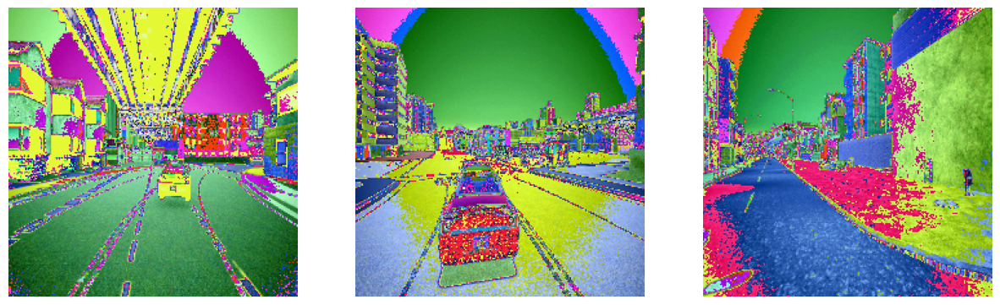


Validation Image Samples:



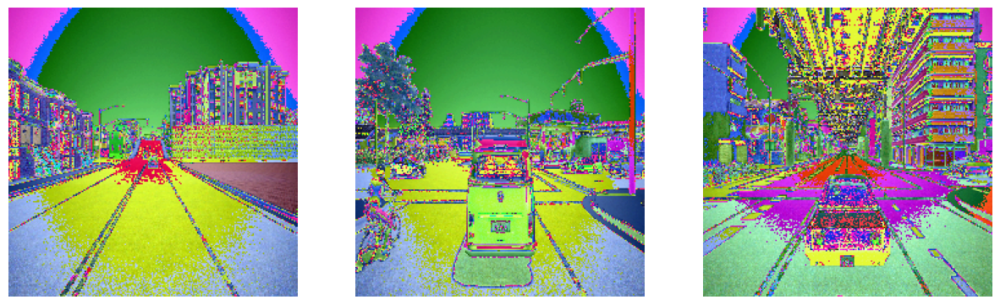


Test Image Samples:



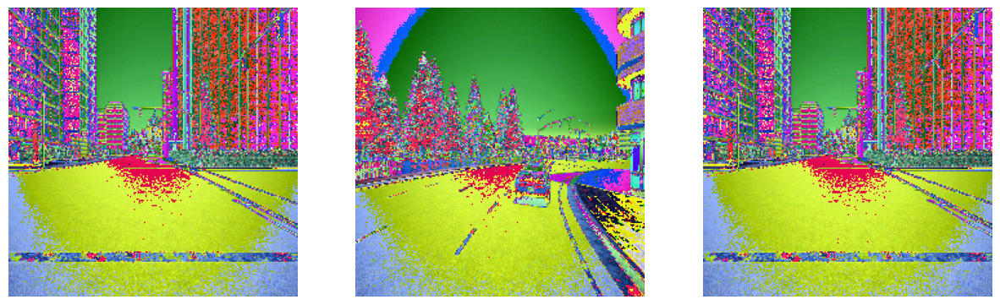

In [135]:
from torchvision.transforms.functional import to_pil_image
import torchvision.transforms.functional as F
import matplotlib.pyplot as plt
import numpy as np

# Function to plot images with bounding boxes
def plot_images(dataset, num_imgs=3):
    fig, axs = plt.subplots(1, num_imgs, figsize=(15, 5))
    for i in range(num_imgs):
        idx = np.random.randint(0, len(dataset))
        img, target = dataset[idx]
        img = F.to_pil_image(img)
        axs[i].imshow(img)
        axs[i].axis('off')
    plt.show()

# Plot some random images from the train, val, and test datasets
print("Train Image Samples:\n")
plot_images(train_dataset, num_imgs=3)
print("\nValidation Image Samples:\n")
plot_images(val_dataset, num_imgs=3)
print("\nTest Image Samples:\n")
plot_images(test_dataset, num_imgs=3)

## Model

In [136]:
import torchvision
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor

def get_object_detection_model(num_classes):
    model = torchvision.models.detection.fasterrcnn_resnet50_fpn(weights=None)

    # Get the number of input features for the classifier
    in_features = model.roi_heads.box_predictor.cls_score.in_features

    # num_classes includes the background
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

    return model

## IOU

In [137]:
# def calculate_iou(box1, box2):
#     # Format of boxes: [x_min, y_min, x_max, y_max]

#     # Calculate coordinates of intersection rectangle
#     x1 = max(box1[0], box2[0])
#     y1 = max(box1[1], box2[1])
#     x2 = min(box1[2], box2[2])
#     y2 = min(box1[3], box2[3])

#     # Calculate area of intersection rectangle
#     intersection_area = max(0, x2 - x1) * max(0, y2 - y1)

#     # Calculate areas of each bounding box
#     box1_area = (box1[2] - box1[0]) * (box1[3] - box1[1])
#     box2_area = (box2[2] - box2[0]) * (box2[3] - box2[1])

#     # Calculate IoU
#     iou = intersection_area / float(box1_area + box2_area - intersection_area) if (box1_area + box2_area - intersection_area) > 0 else 0

#     return iou

## Training the Model

In [138]:
from torch.utils.data import DataLoader

# data_loader = DataLoader(train_dataset, batch_size=4, shuffle=True, num_workers=4, collate_fn=collate_fn)

device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

num_classes = 6

model = get_object_detection_model(num_classes)

model.to(device)

# Optimizer
params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=0.01, momentum=0.9, weight_decay=0.0005)
# optimizer = torch.optim.Adam(params, lr=0.001)

# Learning Rate
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=3, gamma=0.1)

In [139]:
import torch

def train_one_epoch(model, optimizer, data_loader, device, epoch, print_freq):
    model.train()
    running_loss = 0.0
    for i, (images, targets) in enumerate(data_loader):
        images = list(image.to(device) for image in images)
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        loss_dict = model(images, targets)
        losses = sum(loss for loss in loss_dict.values())

        # Backpropagation
        optimizer.zero_grad()
        losses.backward()
        optimizer.step()

        running_loss += losses.item()
        # if i % print_freq == 0:
        #     print(f"Epoch: {epoch+1} [{i * len(images)}/{len(data_loader.dataset)}] Loss: {running_loss / (i + 1)}")

    print(f"Epoch {epoch+1} finished, Avg Loss: {running_loss / len(data_loader)}")

In [140]:
from torchvision.ops import box_iou

def evaluate(model, data_loader, device):
    model.eval()
    total_iou = 0.0
    total_detections = 0

    with torch.no_grad():
        for images, targets in data_loader:
            images = [img.to(device) for img in images]
            targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
            outputs = model(images)

            for target, output in zip(targets, outputs):
                # Get the ground truth and predictions
                gt_boxes = target['boxes']
                pred_boxes = output['boxes']

                # Calculate IoU
                iou = box_iou(gt_boxes, pred_boxes)

                # Consider the case where there are both predictions and ground truths
                if iou.numel() > 0:
                    total_iou += iou.sum().item()  # Sum IoU values for all gt-pred pairs
                    total_detections += iou.numel()  # Count total comparisons made

    # Compute mean IoU
    mean_iou = total_iou / total_detections if total_detections > 0 else 0
    print(f"Mean IoU: {mean_iou}")

In [141]:
num_epochs = 30

for epoch in range(num_epochs):
    # Training for one epoch
    train_one_epoch(model, optimizer, train_loader, device, epoch, print_freq=10)

    # Update the learning rate
    lr_scheduler.step()

    # Save the model weights
    torch.save(model.state_dict(), 'model_weights.pth')

    # Corrected print statement
    # print(f"Model saved at epoch {epoch+1}")

    # Evaluate the model
    evaluate(model, train_loader, device=device)

Epoch 1 finished, Avg Loss: 0.6511394121344127
Mean IoU: 0.0
Epoch 2 finished, Avg Loss: 0.45342747985370574
Mean IoU: 0.02521955486685645
Epoch 3 finished, Avg Loss: 0.421397307798976
Mean IoU: 0.021924387968785822
Epoch 4 finished, Avg Loss: 0.3662953147339442
Mean IoU: 0.02563269231092886
Epoch 5 finished, Avg Loss: 0.3600941742696459
Mean IoU: 0.021939832977010815
Epoch 6 finished, Avg Loss: 0.352339977073291
Mean IoU: 0.024341068240423158
Epoch 7 finished, Avg Loss: 0.34358077709163937
Mean IoU: 0.024305789235100884
Epoch 8 finished, Avg Loss: 0.34109845544610706
Mean IoU: 0.024457907281029995
Epoch 9 finished, Avg Loss: 0.345931686579235
Mean IoU: 0.024735917272889024
Epoch 10 finished, Avg Loss: 0.3336499749668061
Mean IoU: 0.0246759643415189
Epoch 11 finished, Avg Loss: 0.3416762501001358
Mean IoU: 0.02454292718339706
Epoch 12 finished, Avg Loss: 0.34339801588701824
Mean IoU: 0.02506713307479213
Epoch 13 finished, Avg Loss: 0.33918426576114835
Mean IoU: 0.024444200927097058
Epo

In [97]:
# # from google.colab import files

# # Specify the file path in Colab you wish to download
# file_path = '/object_detection_dataset/model_weights.pth'

# # Trigger the download
# files.download(file_path)

In [52]:
# file_path = 'object_detection_dataset/model_weights.pth'
# torch.save(model.state_dict(), file_path)

In [61]:
# # Load the weights
# model_weights_path = 'object_detection_dataset/model_weights.pth'  # or the full path to your .pth file
# model.load_state_dict(torch.load(model_weights_path))

<All keys matched successfully>

## Saving Bbox Coordiantes

In [142]:
# Assuming the necessary imports are already done
import torch
from torchvision.ops import nms

def print_predicted_images(model, val_loader, device, num_images, save_path='bounding_boxes.csv', iou_thresh=0.001):
    model.eval()

    with open(save_path, 'w', newline='') as file:
        writer = csv.writer(file)
        writer.writerow(['image_index', 'xmin', 'ymin', 'xmax', 'ymax', 'label'])

        for i in range(num_images):
            images, targets = next(iter(val_loader))
            images = images.to(device)
            predictions = model(images)

            for index, (image, prediction, target) in enumerate(zip(images, predictions, targets)):
                img = image.permute(1, 2, 0).cpu().detach().numpy()
                
                # Convert bounding boxes and scores to PyTorch tensors
                pred_boxes = torch.tensor(prediction['boxes'].cpu().detach().numpy(), device=device)
                pred_scores = torch.tensor(prediction['scores'].cpu().detach().numpy(), device=device)
                pred_labels = prediction['labels'].cpu().detach().numpy()  # Labels can stay as NumPy arrays for now

                # Apply NMS
                keep = nms(pred_boxes, pred_scores, iou_thresh)
                filtered_boxes = pred_boxes[keep].cpu().numpy()
                filtered_labels = pred_labels[keep.cpu().numpy()]

                # Plotting and saving code remains the same...
                plt.imshow(img)
                ax = plt.gca()
                for box, label in zip(filtered_boxes, filtered_labels):
                    xmin, ymin, xmax, ymax = box
                    writer.writerow([i * len(images) + index, xmin, ymin, xmax, ymax, label])
                    
                    rect = plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin, fill=False, edgecolor='red', linewidth=2)
                    ax.add_patch(rect)
                    plt.text(xmin, ymin, f"Label: {label}", bbox=dict(facecolor='white', alpha=0.5))

                plt.axis('off')
                plt.show()

## Validation

In [211]:
import csv
import matplotlib.pyplot as plt
import torch
from torchvision.ops import nms

# Mapping from numeric labels to class names
label_to_class = {
    1: 'vehicle',
    2: 'bike',
    3: 'motobike',
    4: 'traffic_light',
    5: 'traffic_sign'
}

def print_val_images(model, val_loader, device, num_images, save_path='validation_bounding_boxes.csv', iou_thresh=0.05):
    model.eval()

    with open(save_path, 'w', newline='') as file:
        writer = csv.writer(file)
        # Update header row to include 'confidence' and 'class_name'
        writer.writerow(['image_index', 'xmin', 'ymin', 'xmax', 'ymax', 'label', 'confidence', 'class_name'])

        for i in range(num_images):
            images, targets = next(iter(val_loader))
            images = images.to(device)
            predictions = model(images)

            for index, (image, prediction, target) in enumerate(zip(images, predictions, targets)):
                img = image.permute(1, 2, 0).cpu().detach().numpy()
                
                # Convert bounding boxes and scores to PyTorch tensors
                pred_boxes = torch.tensor(prediction['boxes'].cpu().detach().numpy(), device=device)
                pred_scores = torch.tensor(prediction['scores'].cpu().detach().numpy(), device=device)
                pred_labels = prediction['labels'].cpu().detach().numpy()

                # Apply NMS
                keep = nms(pred_boxes, pred_scores, iou_thresh)
                filtered_boxes = pred_boxes[keep].cpu().numpy()
                filtered_labels = pred_labels[keep.cpu().numpy()]
                filtered_scores = pred_scores[keep].cpu().numpy()

                plt.imshow(img)
                ax = plt.gca()
                for box, label, score in zip(filtered_boxes, filtered_labels, filtered_scores):
                    xmin, ymin, xmax, ymax = box
                    class_name = label_to_class.get(label, "Unknown")
                    # Write the bounding box info, confidence, and class name to the CSV
                    writer.writerow([i * len(images) + index, xmin, ymin, xmax, ymax, label, score, class_name])
                    
                    # Draw the bounding box and label it with the class name and confidence
                    rect = plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin, fill=False, edgecolor='red', linewidth=2)
                    ax.add_patch(rect)
                    plt.text(xmin, ymin, f"{class_name}: {score:.2f}", bbox=dict(facecolor='white', alpha=0.5))

                plt.axis('off')
                plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


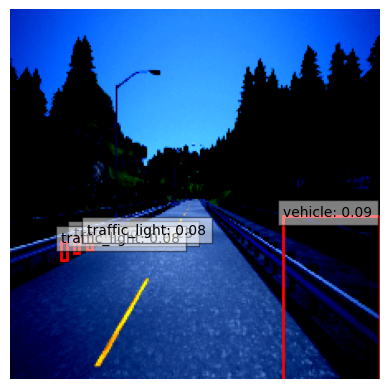

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


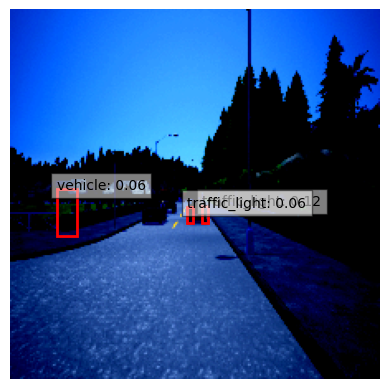

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


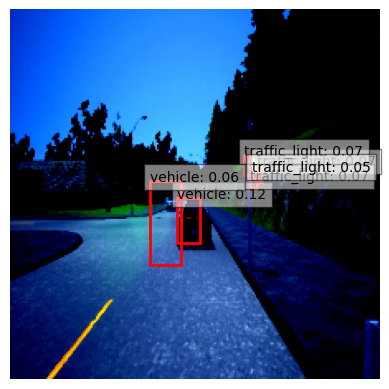

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


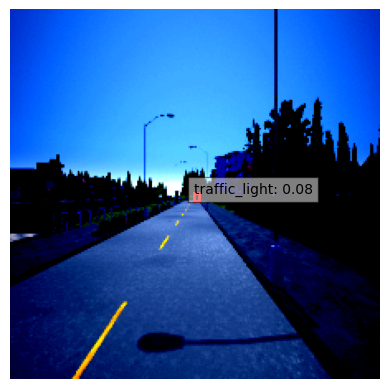

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


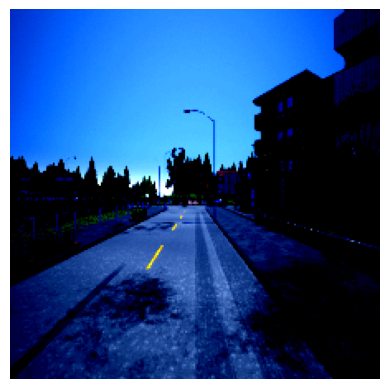

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


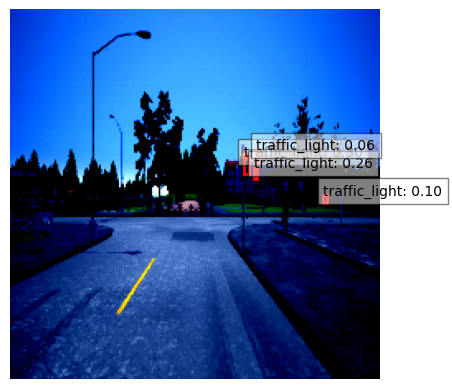

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


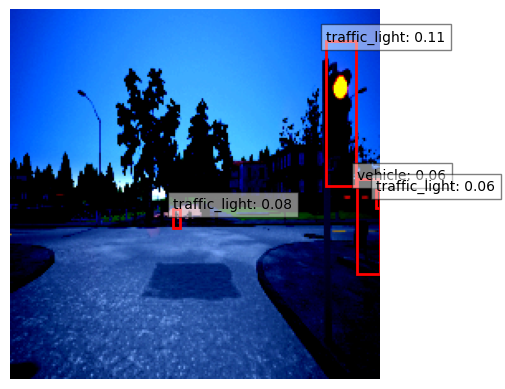

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


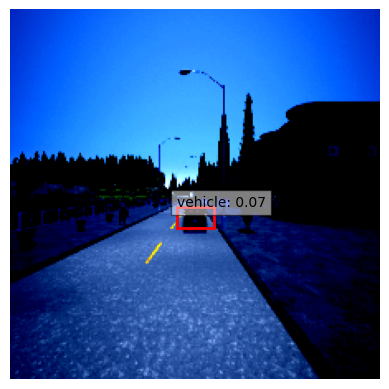

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


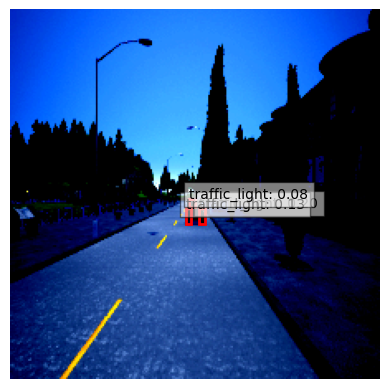

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


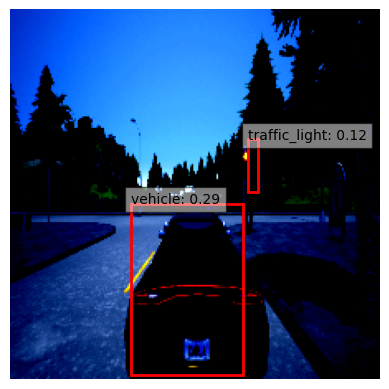

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


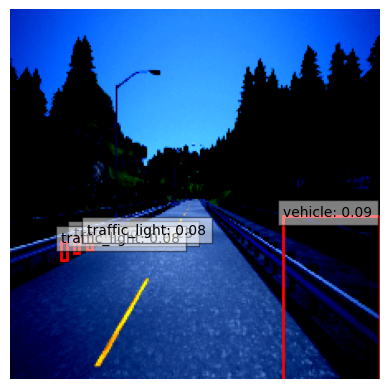

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


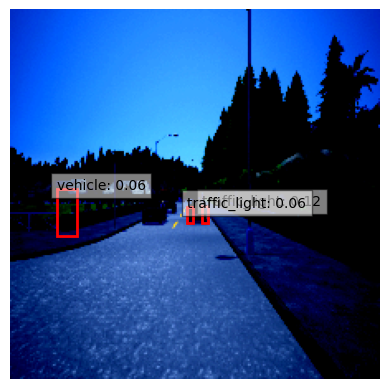

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


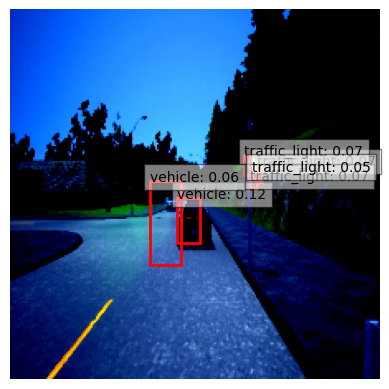

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


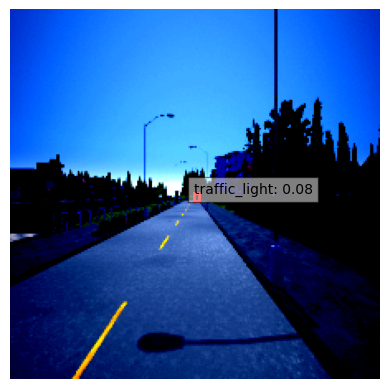

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


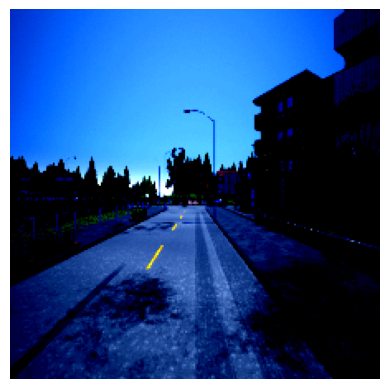

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


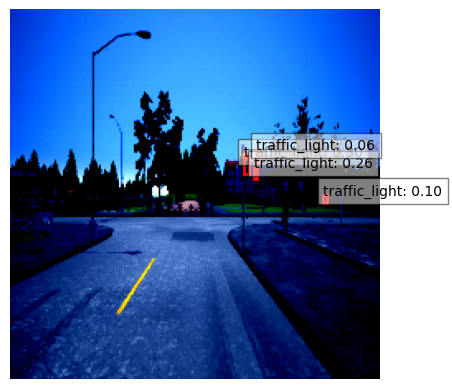

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


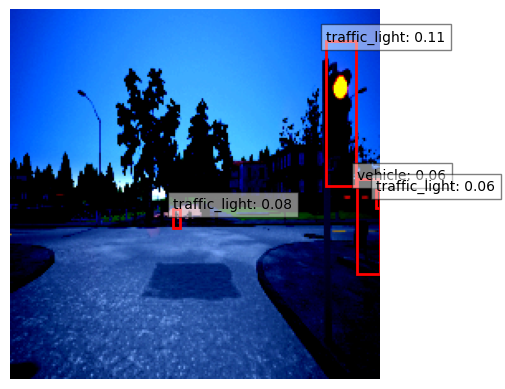

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


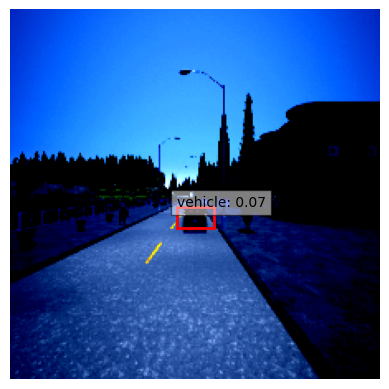

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


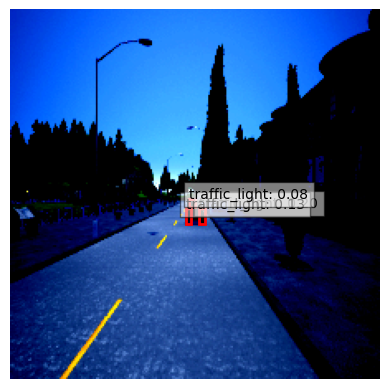

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


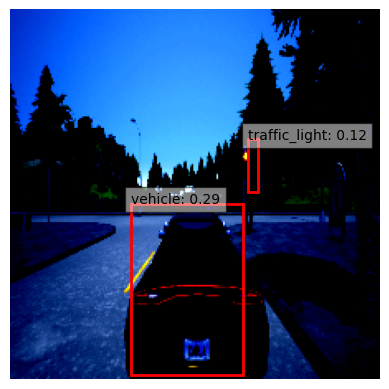

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


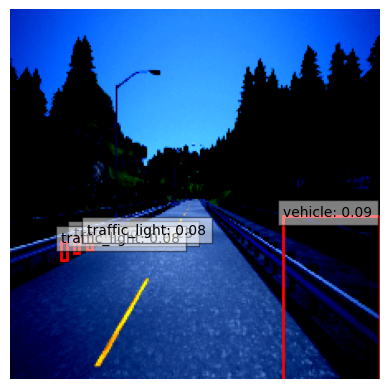

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


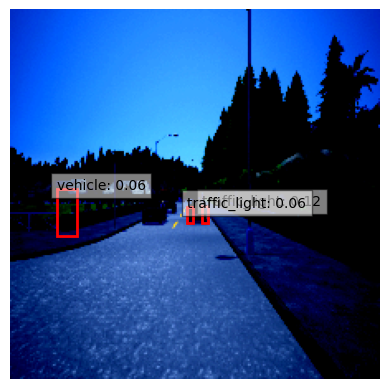

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


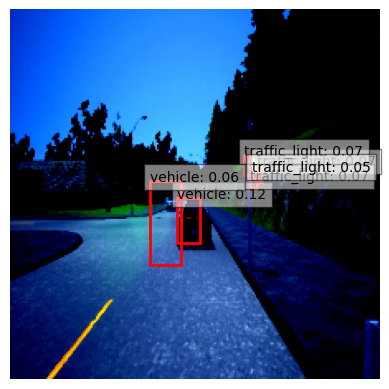

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


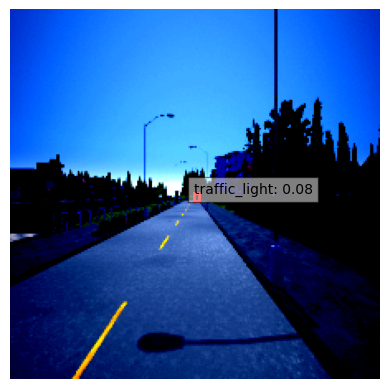

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


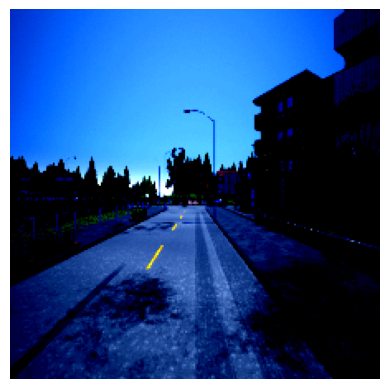

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


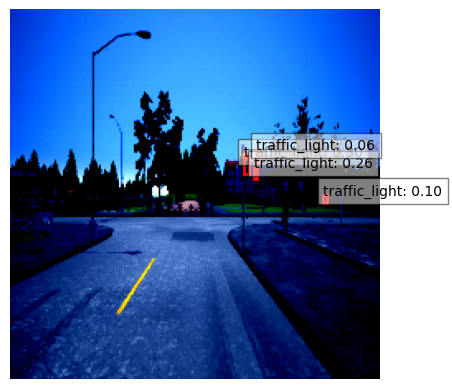

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


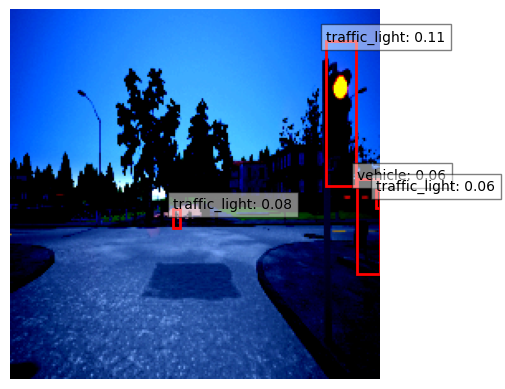

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


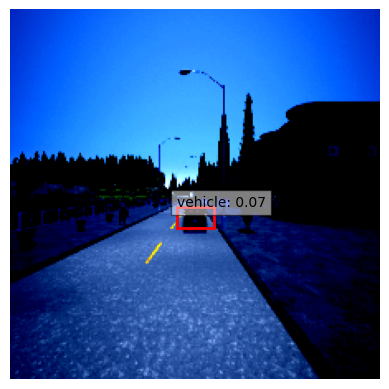

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


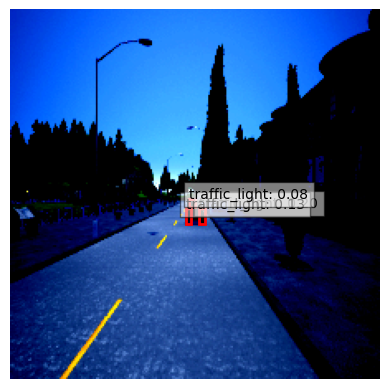

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


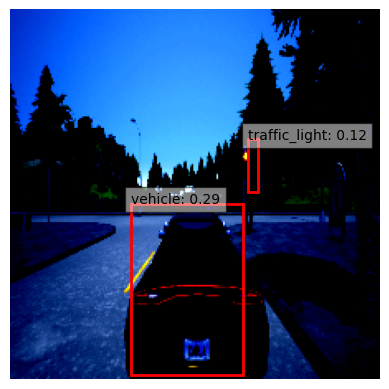

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


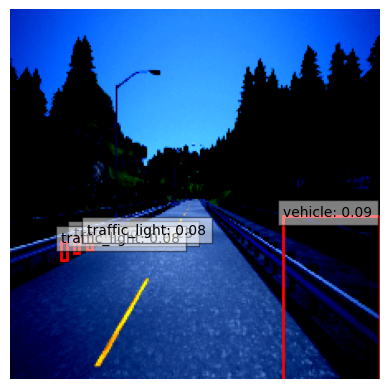

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


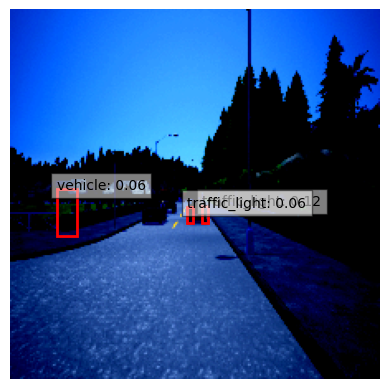

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


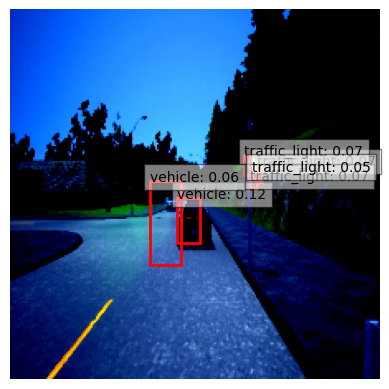

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


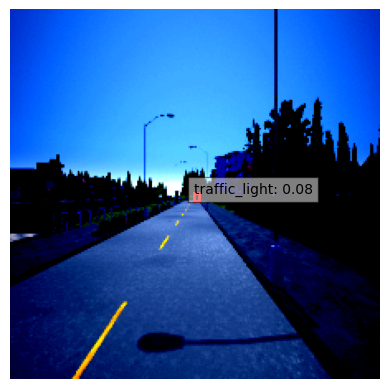

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


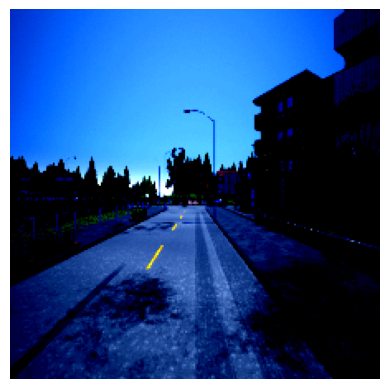

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


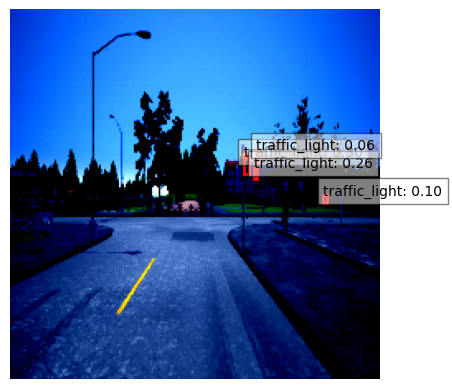

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


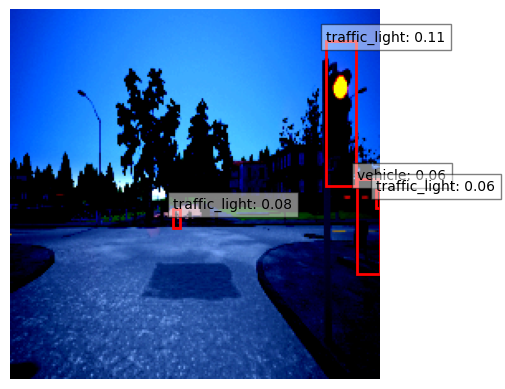

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


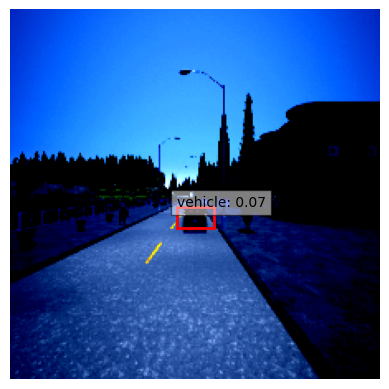

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


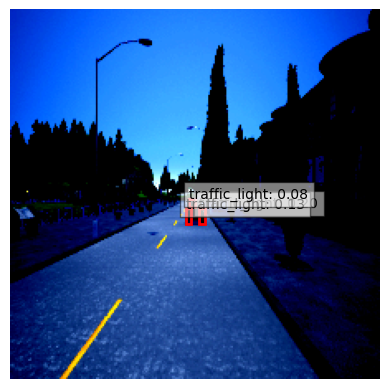

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


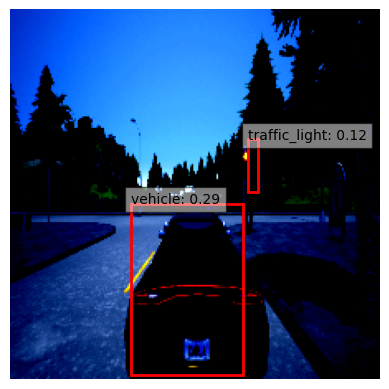

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


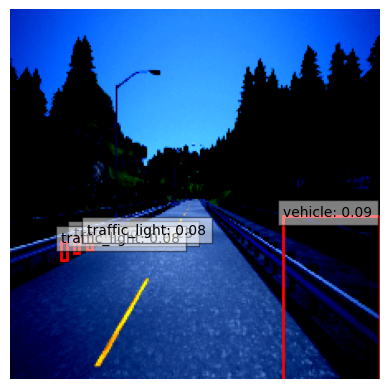

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


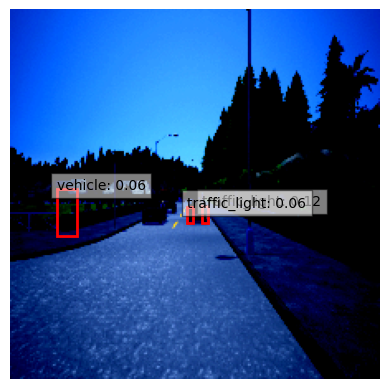

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


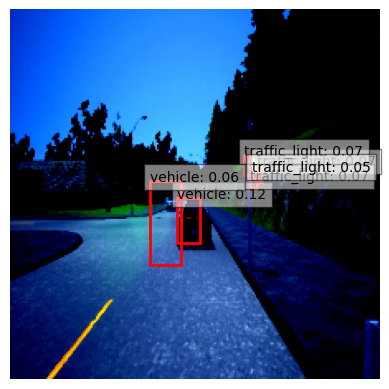

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


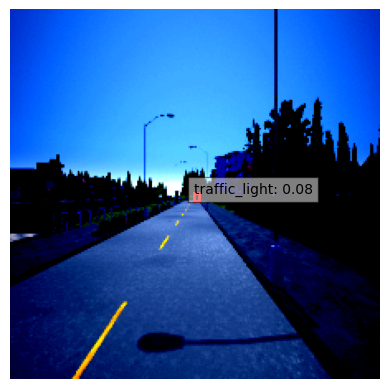

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


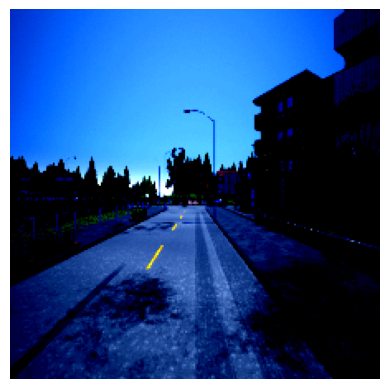

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


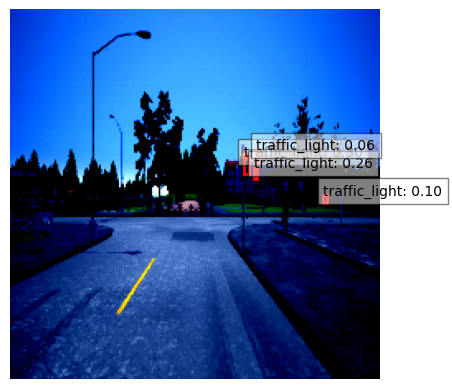

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


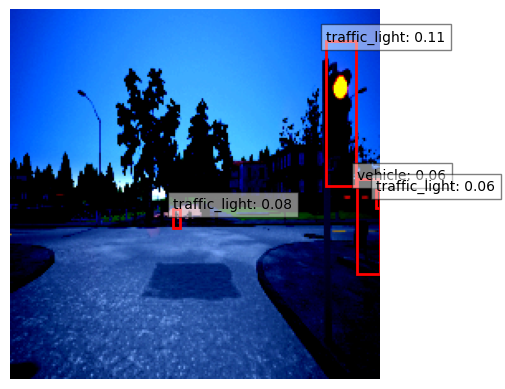

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


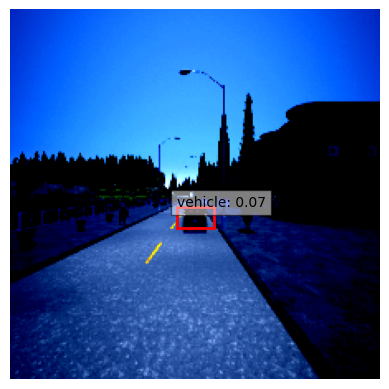

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


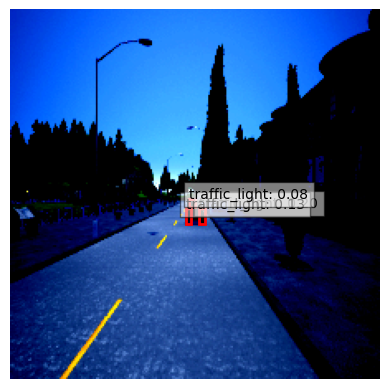

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


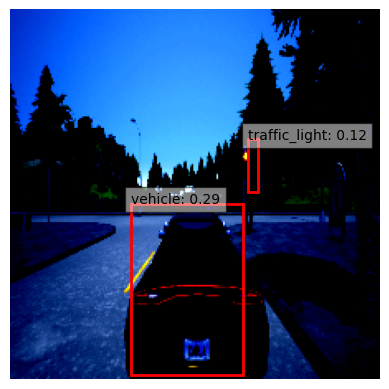

In [212]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
num_images= 5

print_val_images(model, val_loader, device, num_images)

### Validation: Expected vs Predicted Output (Example)

EXPECTED OUTPUT



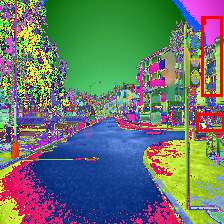

MODEL OUTPUT



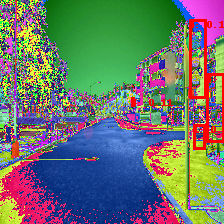

In [210]:
from PIL import Image, ImageDraw, ImageFont
import numpy as np
import torch
import torchvision.transforms as transforms

# Define utility functions
def plot_img_bbox(img, predictions):
    """
    Plot an image with bounding boxes and labels.

    Parameters:
    - img: PIL Image. The image to plot.
    - predictions: dict. The predictions from a model, containing 'boxes', 'labels', and optionally 'scores'.
    """
    draw = ImageDraw.Draw(img)
    try:
        font = ImageFont.truetype("arial.ttf", 15)
    except IOError:
        font = ImageFont.load_default()
    
    for i, box in enumerate(predictions['boxes']):
        box = tuple(box.tolist())
        draw.rectangle(box, outline='red', width=3)
        label = f"{predictions['labels'][i]}"
        if 'scores' in predictions:
            score = predictions['scores'][i]
            label += f": {score:.2f}"
        draw.text((box[0], box[1]), label, fill='red', font=font)
    img.show()

def torch_to_pil(img):
    if isinstance(img, torch.Tensor):
        img = img.cpu()
    return transforms.ToPILImage()(img).convert('RGB')

# Pick one image from the validation set
img, target = val_dataset[34] 
img = img.to(device)

# Putting the model in evaluation mode and make a prediction
model.eval()
with torch.no_grad():
    prediction = model([img])[0]

# Apply non-maximum suppression to filter the prediction
# Assuming apply_nms function is defined correctly
nms_prediction = apply_nms(prediction, iou_thresh=0.01)

# Convert image tensor to PIL for plotting
img_pil = torch_to_pil(img)

print('EXPECTED OUTPUT\n')
# Plot the ground truth
plot_img_bbox(img_pil.copy(), target)  # Ensure target format matches expected by plot_img_bbox

print('MODEL OUTPUT\n')
# Plot the model prediction
plot_img_bbox(img_pil.copy(), nms_prediction)

## Make Predictions on Test Data

In [205]:
import os
import csv
import matplotlib.pyplot as plt
import torch
from torchvision.ops import nms

label_to_class = {
    1: 'vehicle',
    2: 'bike',
    3: 'motobike',
    4: 'traffic_light',
    5: 'traffic_sign'
}

def denormalize(tensor, mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]):
    """
    Denormalize a tensor image with mean and standard deviation.
    """
    mean = torch.tensor(mean, device=tensor.device)[..., :, None, None]
    std = torch.tensor(std, device=tensor.device)[..., :, None, None]
    tensor.mul_(std).add_(mean)
    return tensor

def predict_on_test_set(model, test_loader, device, save_path='test_bounding_boxes.csv', iou_thresh=0.1, images_save_folder='predicted_test_images'):
    model.eval()
    os.makedirs(images_save_folder, exist_ok=True)

    with open(save_path, 'w', newline='') as file:
        writer = csv.writer(file)
        writer.writerow(['image_index', 'xmin', 'ymin', 'xmax', 'ymax', 'label', 'confidence', 'class_name'])

        image_counter = 0  # To keep track of the image index
        for images, _ in test_loader:
            images = images.to(device)
            predictions = model(images)

            for index, image in enumerate(images):
                # Denormalize the image
                denorm_image = denormalize(image.clone()).cpu().detach()
                denorm_image = torch.clamp(denorm_image, 0, 1)  # Clamp the values to be between 0 and 1
                img_np = denorm_image.permute(1, 2, 0).numpy()  # Convert to numpy array

                prediction = predictions[index]
                pred_boxes = torch.tensor(prediction['boxes'].cpu().detach().numpy(), device=device)
                pred_scores = torch.tensor(prediction['scores'].cpu().detach().numpy(), device=device)
                pred_labels = prediction['labels'].cpu().detach().numpy()

                # Apply NMS
                keep = nms(pred_boxes, pred_scores, iou_thresh)
                filtered_boxes = pred_boxes[keep].cpu().numpy()
                filtered_labels = pred_labels[keep.cpu().numpy()]
                filtered_scores = pred_scores[keep].cpu().numpy()

                # Specify figsize and dpi to match the original image size
                fig, ax = plt.subplots(figsize=(6.4, 3.8), dpi=100)  # 640x380 pixels
                ax.imshow(img_np)
                for box, label, score in zip(filtered_boxes, filtered_labels, filtered_scores):
                    xmin, ymin, xmax, ymax = box
                    class_name = label_to_class.get(label, "Unknown")
                    writer.writerow([image_counter, xmin, ymin, xmax, ymax, label, score, class_name])

                    rect = plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin, fill=False, edgecolor='red', linewidth=2)
                    ax.add_patch(rect)
                    ax.text(xmin, ymin, f"{class_name}: {score:.2f}", bbox=dict(facecolor='white', alpha=0.5), fontsize=6, verticalalignment='top')

                ax.axis('off')
                ax.set(xlim=[0, img_np.shape[1]], ylim=[img_np.shape[0], 0], aspect=1)
                plt.subplots_adjust(left=0, right=1, top=1, bottom=0)

                # Save the figure with calculated size to match the original image's resolution
                fig.savefig(os.path.join(images_save_folder, f"predicted_test_{image_counter}.png"), bbox_inches='tight', pad_inches=0)
                plt.close(fig)

                image_counter += 1  # Increment to track/save next image

In [206]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'

predict_on_test_set(model, test_loader, device)

## Plot Images with Predicted BBoxes

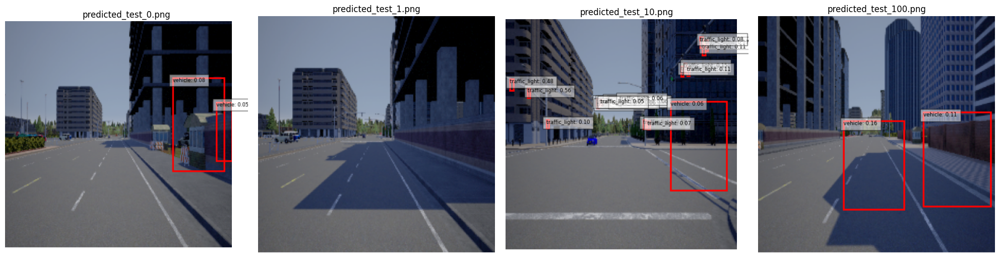

In [208]:
from pathlib import Path
from PIL import Image
import matplotlib.pyplot as plt

def plot_predicted_images(directory='predicted_test_images', num_images=4):
    # Ensure the directory path is a Path object for easy manipulation
    directory = Path(directory)
    
    # Get all image file paths
    image_files = list(directory.glob('*.png'))
    
    # If there are fewer images than num_images, adjust num_images accordingly
    num_images = min(num_images, len(image_files))
    
    # Plot num_images images
    fig, axs = plt.subplots(1, num_images, figsize=(20, 5))  # Adjust figure size as needed
    
    for ax, image_file in zip(axs, image_files[:num_images]):
        image = Image.open(image_file)
        ax.imshow(image)
        ax.axis('off')  # Hide axes
        ax.set_title(image_file.name)
    
    plt.tight_layout()
    plt.show()

# Call the function
plot_predicted_images(directory='predicted_test_images', num_images=4)

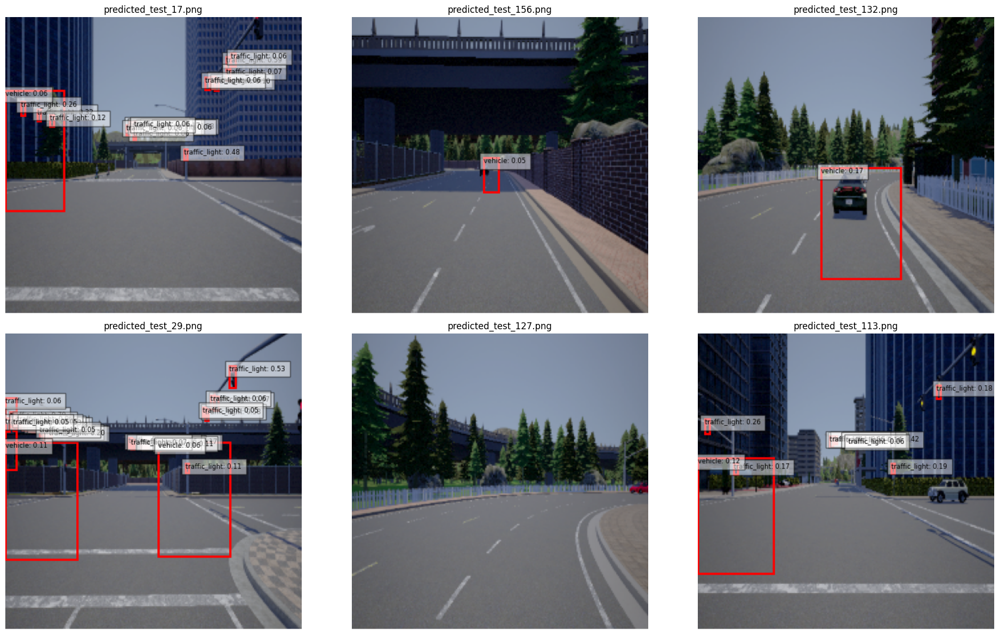

In [209]:
import os
import random
from PIL import Image
import matplotlib.pyplot as plt

def plot_random_images_from_folder(folder_path, n=5):
    # Get all image filenames in the folder
    image_filenames = [f for f in os.listdir(folder_path) if f.endswith(('.png', '.jpg', '.jpeg'))]  # Added support for multiple image formats
    
    # Randomly select n images (or all if there are fewer than n)
    selected_images = random.sample(image_filenames, min(n, len(image_filenames)))
    
    # Determine the number of rows needed to display the images
    num_rows = (len(selected_images) + 2) // 3  # Adjust the divisor to change the number of images per row
    
    # Plotting
    fig, axes = plt.subplots(num_rows, 3, figsize=(20, num_rows * 6))  # Adjust the size as needed
    axes = axes.flatten()
    
    for ax, image_name in zip(axes, selected_images):
        image_path = os.path.join(folder_path, image_name)
        image = Image.open(image_path)
        ax.imshow(image)
        ax.set_title(image_name)
        ax.axis('off')
    
    # Hide unused subplots if the number of selected images is less than the total number of subplots
    for ax in axes[len(selected_images):]:
        ax.axis('off')
    
    plt.tight_layout()
    plt.show()

# Example usage
folder_path = 'predicted_test_images'
plot_random_images_from_folder(folder_path, n=6)

## Compute IoU Score

In [213]:
def bbox_iou(box1, box2):
    """
    Calculate the Intersection over Union (IoU) of two bounding boxes.
    Parameters:
    box1, box2 -- tensors of shape (4,), where each box is defined by (xmin, ymin, xmax, ymax)
    """
    # Determine the coordinates of the intersection rectangle
    x_left = max(box1[0], box2[0])
    y_top = max(box1[1], box2[1])
    x_right = min(box1[2], box2[2])
    y_bottom = min(box1[3], box2[3])

    # Calculate the area of intersection rectangle
    intersection_area = max(0, x_right - x_left + 1) * max(0, y_bottom - y_top + 1)

    # Calculate the area of both bounding boxes
    box1_area = (box1[2] - box1[0] + 1) * (box1[3] - box1[1] + 1)
    box2_area = (box2[2] - box2[0] + 1) * (box2[3] - box2[1] + 1)

    # Calculate the union area by using both areas and intersection area
    union_area = box1_area + box2_area - intersection_area

    # Compute the IoU
    iou = intersection_area / union_area

    return iou

In [214]:
def evaluate_model_on_test_set(model, test_loader, device):
    model.eval()
    ious = []  # List to store IoUs for each prediction-ground truth pair

    for images, targets in test_loader:
        images = list(img.to(device) for img in images)
        predictions = model(images)

        for image, prediction, target in zip(images, predictions, targets):
            # Apply NMS to predictions
            keep = nms(prediction['boxes'], prediction['scores'], 0.1)
            pred_boxes_after_nms = prediction['boxes'][keep]

            # Loop through each ground truth and predicted box pair to calculate IoU
            for gt_box in target['boxes']:
                for pred_box in pred_boxes_after_nms:
                    iou = bbox_iou(gt_box.cpu(), pred_box.cpu())
                    ious.append(iou.item())

    # Calculate the mean IoU across all prediction-ground truth pairs
    mean_iou = sum(ious) / len(ious) if ious else 0
    print(f"Mean IoU: {mean_iou}")

    return mean_iou

# Call the function with your model, test_loader, and device
mean_iou = evaluate_model_on_test_set(model, test_loader, device)

Mean IoU: 0.02963475401546829
